In [1]:
import os
import numpy as np
import plotly.graph_objects as go

# --- Custom Plotly Template ---
fig_template = go.layout.Template()
fig_template.layout = {
    'template': 'simple_white+presentation',
    'autosize': False,
    'width': 800,
    'height': 600,
    'xaxis': {
        'ticks': 'inside',
        'mirror': 'ticks',
        'linewidth': 2.0,
        'tickwidth': 2.0,
        'ticklen': 6,
        'showline': True,
        'showgrid': False,
        'zerolinecolor': 'white',
    },
    'yaxis': {
        'ticks': 'inside',
        'mirror': 'ticks',
        'linewidth': 2.0,
        'tickwidth': 2.0,
        'ticklen': 6,
        'showline': True,
        'showgrid': False,
        'zerolinecolor': 'white'
    },
    'font': {
        'family': 'mathjax',
        'size': 22,
    }
}

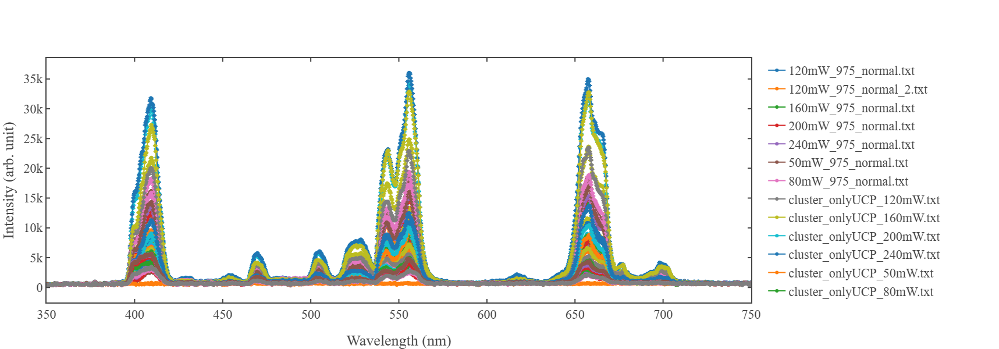

Plot successfully saved to: D:/Atanu/droplet/Droplet_project/06_08_25\pl_intensity_vs_wavelength_all_plots.html


In [5]:
import os
import plotly.graph_objects as go
import numpy as np

# --- Base path ---
base_path = r"D:/Atanu/droplet/Droplet_project/06_08_25"

# --- Initialize figure ---
fig = go.Figure()

# --- List all .txt files in the base_path ---
txt_files = sorted([f for f in os.listdir(base_path) if f.endswith('.txt')])

for txt_file in txt_files:
    file_path = os.path.join(base_path, txt_file)

    # Assuming each .txt file has two columns: wavelength (nm) and intensity (counts)
    data = np.loadtxt(file_path)
    wavelength = data[:, 0]
    intensity = data[:, 1]

    # If you have error values (e.g., std deviation), load or compute here, else zeros
    std_intensity = np.zeros_like(intensity)

    # Add trace for this file
    fig.add_trace(go.Scatter(
        x=wavelength,
        y=intensity,
        mode='lines+markers',
        name=txt_file,
        error_y=dict(
            type='data',
            array=std_intensity,
            visible=True
        )
    ))

# --- Final layout ---
fig.update_layout(
    template=fig_template,  # Use your custom template or 'plotly_white' if undefined
    # title=f'Photoluminescence Intensity vs Wavelength for files in {base_path}',
    xaxis_title='Wavelength (nm)',
    yaxis_title='Intensity (arb. unit)',
    height = 600,
    width = 1000,
    xaxis=dict(range=[350,750]) 
)

# --- Show and Save ---
fig.show()

html_output_path = os.path.join(base_path, "pl_intensity_vs_wavelength_all_plots.html")
fig.write_html(html_output_path)
print(f"Plot successfully saved to: {html_output_path}")